## Import Libraries

In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use("fivethirtyeight")
import seaborn as sns
sns.set_style('whitegrid')
from pandas_datareader.data import DataReader
from datetime import datetime
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
from finta import TA
from backtesting import Backtest, Strategy
from backtesting.lib import crossover, plot_heatmaps
from backtesting.test import SMA, GOOG
from skopt.plots import plot_objective

## Load Dataset

In [2]:
KO_Data = pd.read_csv('Coca-Cola_stock_history.csv')
KO_Data.shape

(15311, 8)

In [3]:
KO_Data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


## Basic EMA

In [35]:
KO_Data['EMA5'] = KO_Data.Close.ewm(span=5, adjust=False).mean()
KO_Data['EMA20'] = KO_Data.Close.ewm(span=20, adjust=False).mean()
KO_Data['EMA50'] = KO_Data.Close.ewm(span=50, adjust=False).mean()
KO_Data['EMA200'] = KO_Data.Close.ewm(span=200, adjust=False).mean()
KO_Data['EMA500'] = KO_Data.Close.ewm(span=500, adjust=False).mean()

In [36]:
KO_Data.head().T

,0,1,2,3,4
level_0,0,1,2,3,4
index,0,1,2,3,4
Date,1962-01-02,1962-01-03,1962-01-04,1962-01-05,1962-01-08
Open,0.050016,0.049273,0.049026,0.049273,0.047787
High,0.051378,0.049273,0.049645,0.049892,0.047787
Low,0.050016,0.048159,0.049026,0.048035,0.046735
Close,0.050016,0.048902,0.049273,0.048159,0.047664
Volume,806400,1574400,844800,1420800,2035200
Dividends,0.0,0.0,0.0,0.0,0.0
Stock Splits,0,0,0,0,0


In [37]:
fig = go.Figure(data = [
    go.Ohlc(
        x=KO_Data['Date'],
        open=KO_Data['Open'],
        high=KO_Data['High'],
        low=KO_Data['Low'],
        close=KO_Data['Close'], name =
        "OHLC"),
    
    go.Scatter(
        x=KO_Data.Date,
        y=KO_Data.SMA5,
        line=dict(color='orange', width=1),
        name="EMA5"),

    go.Scatter(
        x=KO_Data.Date,
        y=KO_Data.SMA20,
        line=dict(color='green', width=1),
        name="EMA20"),

    go.Scatter(
        x=KO_Data.Date,
        y=KO_Data.SMA50,
        line=dict(color='blue', width=1),
        name="EMA50"),

    go.Scatter(
        x=KO_Data.Date,
        y=KO_Data.SMA200,
        line=dict(color='violet', width=1),
        name="EMA200"),

    go.Scatter(
        x=KO_Data.Date,
        y=KO_Data.SMA500,
        line=dict(color='purple', width=1),
        name="EMA500"
    )
]
               )
fig.show()

## FINTA Tech Analysis Ratios

Do a financial ratios calculation using FINTA library:

● Simple Moving Average 'SMA'   
● Simple Moving Median 'SMM'   
● Smoothed Simple Moving Average 'SSMA'   
● Exponential Moving Average 'EMA'   
● Double Exponential Moving Average 'DEMA'   
● Triple Exponential Moving Average 'TEMA'   
● Triangular Moving Average 'TRIMA'   
● Triple Exponential Moving Average Oscillator 'TRIX'   
● Volume Adjusted Moving Average 'VAMA'   
● Kaufman Efficiency Indicator 'ER'   
● Kaufman's Adaptive Moving Average 'KAMA'   
● Zero Lag Exponential Moving Average 'ZLEMA'   
● Weighted Moving Average 'WMA'   
● Hull Moving Average 'HMA'   
● Elastic Volume Moving Average 'EVWMA'
● Volume Weighted Average Price 'VWAP'   
● Smoothed Moving Average 'SMMA'   
● Fractal Adaptive Moving Average 'FRAMA'   
● Moving Average Convergence Divergence 'MACD'   
● Percentage Price Oscillator 'PPO'   
● Volume-Weighted MACD 'VW_MACD'   
● Elastic-Volume weighted MACD 'EV_MACD'   
● Market Momentum 'MOM'   
● Rate-of-Change 'ROC'   
● Relative Strenght Index 'RSI'   
● Inverse Fisher Transform RSI 'IFT_RSI'   
● True Range 'TR'   
● Average True Range 'ATR'   
● Stop-and-Reverse 'SAR'   
● Bollinger Bands 'BBANDS'   
● Bollinger Bands Width 'BBWIDTH'   
● Momentum Breakout Bands 'MOBO'   
● Percent B 'PERCENT_B'   
● Keltner Channels 'KC'   
● Donchian Channel 'DO'   
● Directional Movement Indicator 'DMI'   
● Average Directional Index 'ADX'   
● Pivot Points 'PIVOT'   
● Fibonacci Pivot Points 'PIVOT_FIB'   
● Stochastic Oscillator %K 'STOCH'   
● Stochastic oscillator %D 'STOCHD'   
● Stochastic RSI 'STOCHRSI'   
● Williams %R 'WILLIAMS'   
● Ultimate Oscillator 'UO'   
● Awesome Oscillator 'AO'   
● Mass Index 'MI'   
● Vortex Indicator 'VORTEX'   
● Know Sure Thing 'KST'   
● True Strength Index 'TSI'   
● Typical Price 'TP'   
● Accumulation-Distribution Line 'ADL'   
● Chaikin Oscillator 'CHAIKIN'   
● Money Flow Index 'MFI'   
● On Balance Volume 'OBV'   
● Weighter OBV 'WOBV'   
● Volume Zone Oscillator 'VZO'   
● Price Zone Oscillator 'PZO'   
● Elder's Force Index 'EFI'   
● Cummulative Force Index 'CFI'   
● Bull power and Bear Power 'EBBP'   
● Ease of Movement 'EMV'   
● Commodity Channel Index 'CCI'   
● Coppock Curve 'COPP'   
● Buy and Sell Pressure 'BASP'   
● Normalized BASP 'BASPN'   
● Chande Momentum Oscillator 'CMO'   
● Chandelier Exit 'CHANDELIER'   
● Qstick 'QSTICK'   
● Twiggs Money Index 'TMF'   
● Wave Trend Oscillator 'WTO'   
● Fisher Transform 'FISH'   
● Ichimoku Cloud 'ICHIMOKU'   
● Adaptive Price Zone 'APZ'   
● Squeeze Momentum Indicator 'SQZMI'   
● Volume Price Trend 'VPT'   
● Finite Volume Element 'FVE'   
● Volume Flow Indicator 'VFI'   
● Moving Standard deviation 'MSD'   
● Schaff Trend Cycle 'STC'   

In [38]:
fin_ma = pd.read_csv('Coca-Cola_stock_history.csv', parse_dates=True)
fin_ma.shape

(15311, 8)

In [39]:
fin_ma.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [40]:
ohlc = fin_ma

In [56]:
ohlc.dtypes

Date             object
Open            float64
High            float64
Low             float64
Close           float64
Volume            int64
Dividends       float64
Stock Splits      int64
dtype: object

In [57]:
ohlc.shape

(15311, 8)

In [58]:
ohlc.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [59]:
ohlc.index

RangeIndex(start=0, stop=15311, step=1)

In [43]:
TA.SMA(ohlc, 42)

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    58.759467
15307    58.572686
15308    58.422110
15309    58.297065
15310    58.219369
Name: 42 period SMA, Length: 15311, dtype: float64

In [ ]:
# ohlc.index = ohlc[index].dt.date

In [78]:
function_dict = {' Simple Moving Average ' : 'SMA',
                ' Simple Moving Median ' : 'SMM',
                ' Smoothed Simple Moving Average ' : 'SSMA',
                ' Exponential Moving Average ' : 'EMA',
                ' Double Exponential Moving Average ' : 'DEMA',
                ' Triple Exponential Moving Average ' : 'TEMA',
                ' Triangular Moving Average ' : 'TRIMA',
                ' Triple Exponential Moving Average Oscillator ' : 'TRIX',
                ' Volume Adjusted Moving Average ' : 'VAMA',
                ' Kaufman Efficiency Indicator ' : 'ER',
                # ' Kaufmans Adaptive Moving Average ' : 'KAMA',
                ' Zero Lag Exponential Moving Average ' : 'ZLEMA',
                ' Weighted Moving Average ' : 'WMA',
                ' Hull Moving Average ' : 'HMA',
                # ' Elastic Volume Moving Average ' : 'EVWMA',
                ' Volume Weighted Average Price ' : 'VWAP',
                ' Smoothed Moving Average ' : 'SMMA',
                ' Fractal Adaptive Moving Average ' : 'FRAMA',
                ' Moving Average Convergence Divergence ' : 'MACD',
                ' Percentage Price Oscillator ' : 'PPO',
                ' Volume-Weighted MACD ' : 'VW_MACD',
                # ' Elastic-Volume weighted MACD ' : 'EV_MACD',
                ' Market Momentum ' : 'MOM',
                ' Rate-of-Change ' : 'ROC',
                ' Relative Strength Index ' : 'RSI',
                ' Inverse Fisher Transform RSI ' : 'IFT_RSI',
                ' True Range ' : 'TR',
                ' Average True Range ' : 'ATR',
                ' Stop-and-Reverse ' : 'SAR',
                ' Bollinger Bands ' : 'BBANDS',
                ' Bollinger Bands Width ' : 'BBWIDTH',
                ' Momentum Breakout Bands ' : 'MOBO',
                ' Percent B ' : 'PERCENT_B',
                ' Keltner Channels ' : 'KC',
                ' Donchian Channel ' : 'DO',
                ' Directional Movement Indicator ' : 'DMI',
                ' Average Directional Index ' : 'ADX',
                ' Pivot Points ' : 'PIVOT',
                ' Fibonacci Pivot Points ' : 'PIVOT_FIB',
                ' Stochastic Oscillator Percent K ' : 'STOCH',
                ' Stochastic oscillator Percent D ' : 'STOCHD',
                ' Stochastic RSI ' : 'STOCHRSI',
                ' Williams Percent R ' : 'WILLIAMS',
                ' Ultimate Oscillator ' : 'UO',
                ' Awesome Oscillator ' : 'AO',
                ' Mass Index ' : 'MI',
                # ' Vortex Indicator ' : 'VORTEX',
                ' Know Sure Thing ' : 'KST',
                ' True Strength Index ' : 'TSI',
                ' Typical Price ' : 'TP',
                ' Accumulation-Distribution Line ' : 'ADL',
                ' Chaikin Oscillator ' : 'CHAIKIN',
                ' Money Flow Index ' : 'MFI',
                ' On Balance Volume ' : 'OBV',
                ' Weighter OBV ' : 'WOBV',
                ' Volume Zone Oscillator ' : 'VZO',
                ' Price Zone Oscillator ' : 'PZO',
                ' Elders Force Index ' : 'EFI',
                ' Cummulative Force Index ' : 'CFI',
                ' Bull power and Bear Power ' : 'EBBP',
                ' Ease of Movement ' : 'EMV',
                ' Commodity Channel Index ' : 'CCI',
                ' Coppock Curve ' : 'COPP',
                ' Buy and Sell Pressure ' : 'BASP',
                ' Normalized BASP ' : 'BASPN',
                ' Chande Momentum Oscillator ' : 'CMO',
                ' Chandelier Exit ' : 'CHANDELIER',
                ' Qstick ' : 'QSTICK',
                # ' Twiggs Money Index ' : 'TMF',
                ' Wave Trend Oscillator ' : 'WTO',
                ' Fisher Transform ' : 'FISH',
                ' Ichimoku Cloud ' : 'ICHIMOKU',
                ' Adaptive Price Zone ' : 'APZ',
                # ' Squeeze Momentum Indicator ' : 'SQZMI',
                ' Volume Price Trend ' : 'VPT',
                ' Finite Volume Element ' : 'FVE',
                ' Volume Flow Indicator ' : 'VFI',
                ' Moving Standard deviation ' : 'MSD',
                ' Schaff Trend Cycle ' : 'STC'
                }

In [72]:
key = ' Simple Moving Average '
value = 'SMA'
function_name = "TA." + value + "(ohlc).plot(title='" + key + "for Coca Cola / Coke Stock')"
print(function_name)

TA.SMA(ohlc).plot(title=' Simple Moving Average for Coca Cola / Coke Stock')


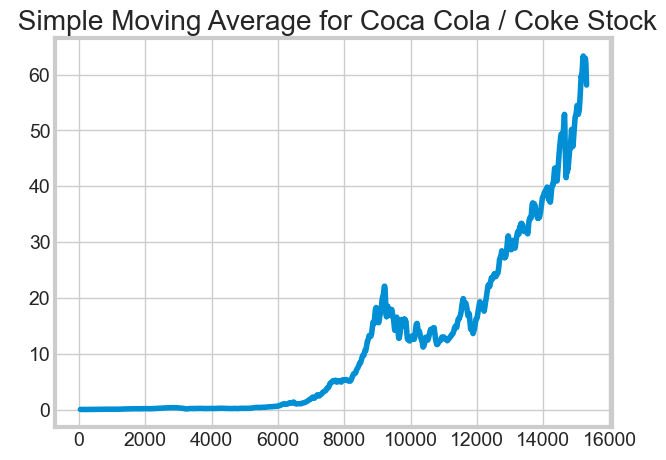

In [73]:
result = eval(function_name)

Calculating: TA.SMA(ohlc)
Type of result for  Simple Moving Average : <class 'pandas.core.series.Series'>
Result for  Simple Moving Average :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    58.636410
15307    58.442894
15308    58.281140
15309    58.190817
15310    58.120428
Name: 41 period SMA, Length: 15311, dtype: float64

Plotting error (Series) for  Simple Moving Average : no numeric data to plot

Calculating: TA.SMM(ohlc)
Type of result for  Simple Moving Median : <class 'pandas.core.series.Series'>
Result for  Simple Moving Median :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    55.139999
15307    55.689999
15308    55.869999
15309    55.959999
15310    55.959999
Name: 9 period SMM, Length: 15311, dtype: float64

Plotting error (Series) for  Simple Moving Median : no numeric data to plot

Calculating: TA.SSMA(ohlc)
Type of result 

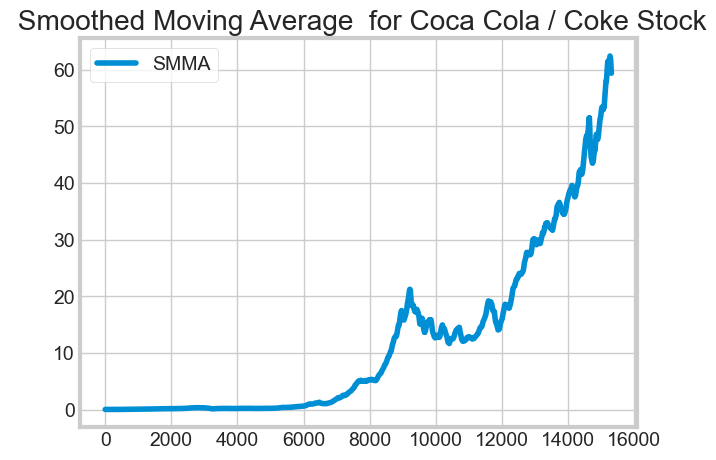


Calculating: TA.FRAMA(ohlc)
Type of result for  Fractal Adaptive Moving Average : <class 'pandas.core.series.Series'>
Result for  Fractal Adaptive Moving Average :
0         0.050016
1         0.048902
2         0.049273
3         0.048159
4         0.047664
           ...    
15306    55.856551
15307    55.862085
15308    55.898444
15309    56.171578
15310    56.589819
Name: 16 period FRAMA., Length: 15311, dtype: float64

Plotting error (Series) for  Fractal Adaptive Moving Average : no numeric data to plot

Calculating: TA.MACD(ohlc)
Type of result for  Moving Average Convergence Divergence : <class 'pandas.core.frame.DataFrame'>
Result for  Moving Average Convergence Divergence :
           MACD    SIGNAL
0      0.000000  0.000000
1     -0.000025 -0.000014
2     -0.000020 -0.000017
3     -0.000058 -0.000031
4     -0.000097 -0.000050
...         ...       ...
15306 -1.141284 -1.363732
15307 -1.040432 -1.299072
15308 -0.821127 -1.203483
15309 -0.529864 -1.068759
15310 -0.260528 -0.9

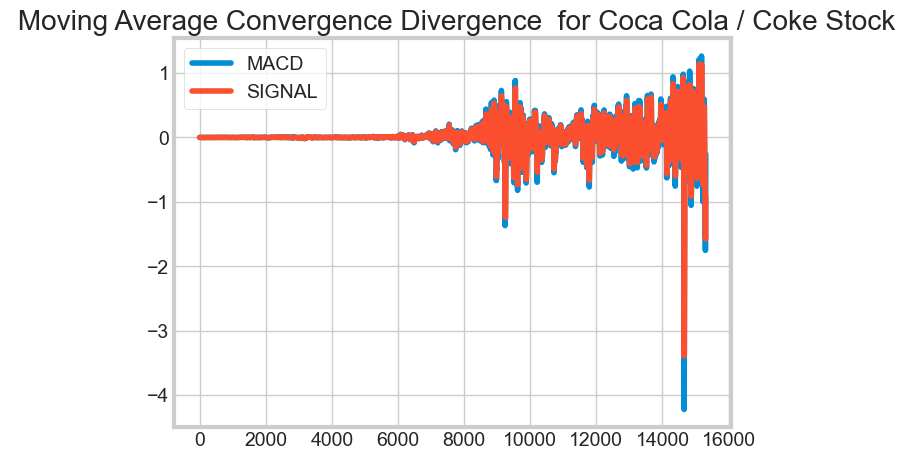


Calculating: TA.PPO(ohlc)
Type of result for  Percentage Price Oscillator : <class 'pandas.core.frame.DataFrame'>
Result for  Percentage Price Oscillator :
            PPO    SIGNAL     HISTO
0      0.000000  0.000000  0.000000
1     -0.050572 -0.028095 -0.022476
2     -0.041180 -0.033458 -0.007722
3     -0.118167 -0.062154 -0.056014
4     -0.198830 -0.102812 -0.096018
...         ...       ...       ...
15306 -2.005884 -2.370950  0.365066
15307 -1.830863 -2.262932  0.432069
15308 -1.443552 -2.099056  0.655505
15309 -0.929006 -1.865046  0.936040
15310 -0.455389 -1.583115  1.127726

[15311 rows x 3 columns]



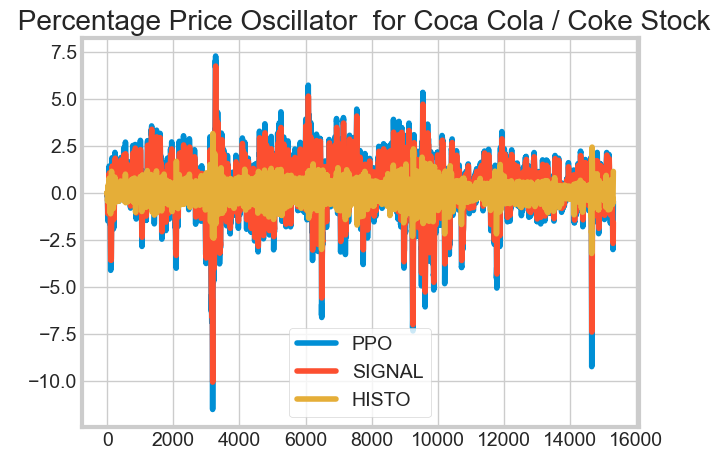


Calculating: TA.VW_MACD(ohlc)
Type of result for  Volume-Weighted MACD : <class 'pandas.core.frame.DataFrame'>
Result for  Volume-Weighted MACD :
           MACD    SIGNAL
0      0.000000  0.000000
1     -0.000022 -0.000012
2     -0.000015 -0.000013
3     -0.000053 -0.000027
4     -0.000090 -0.000045
...         ...       ...
15306 -1.013272 -1.162215
15307 -0.917264 -1.113224
15308 -0.672535 -1.025087
15309 -0.226758 -0.865421
15310 -0.031162 -0.698569

[15311 rows x 2 columns]



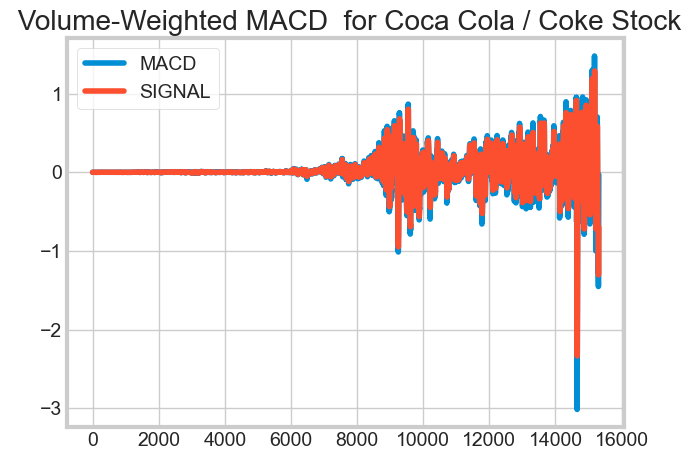


Calculating: TA.MOM(ohlc)
Type of result for  Market Momentum : <class 'pandas.core.series.Series'>
Result for  Market Momentum :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306    0.050003
15307    1.450001
15308    3.180000
15309    4.470001
15310    4.250000
Name: MOM, Length: 15311, dtype: float64



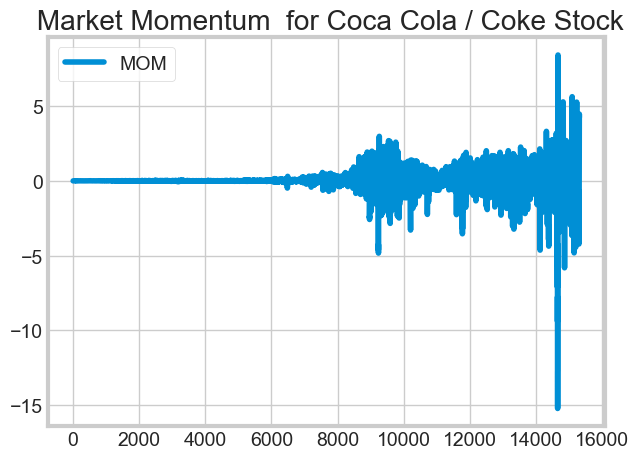


Calculating: TA.ROC(ohlc)
Type of result for  Rate-of-Change : <class 'pandas.core.series.Series'>
Result for  Rate-of-Change :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306   -2.994007
15307   -0.497871
15308    4.615666
15309    8.145299
15310    9.192866
Name: ROC, Length: 15311, dtype: float64



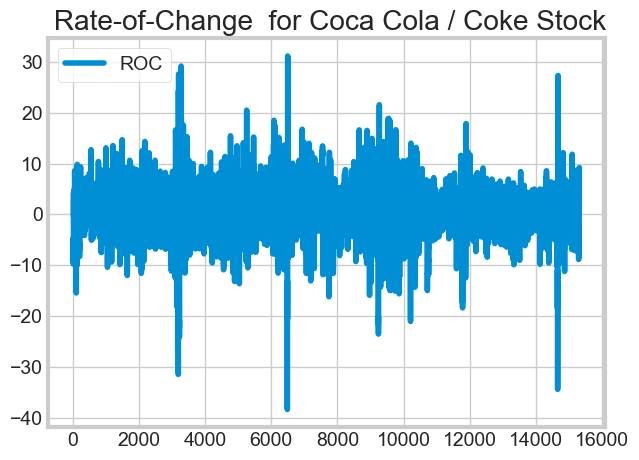


Calculating: TA.RSI(ohlc)
Type of result for  Relative Strength Index : <class 'pandas.core.series.Series'>
Result for  Relative Strength Index :
0              NaN
1         0.000000
2        26.421565
3        14.256198
4        11.682242
           ...    
15306    37.801393
15307    44.115818
15308    53.430787
15309    59.640560
15310    61.407557
Name: 14 period RSI, Length: 15311, dtype: float64

Plotting error (Series) for  Relative Strength Index : no numeric data to plot

Calculating: TA.IFT_RSI(ohlc)
Type of result for  Inverse Fisher Transform RSI : <class 'pandas.core.series.Series'>
Result for  Inverse Fisher Transform RSI :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306   -0.938226
15307   -0.990980
15308   -0.535101
15309    0.073872
15310    0.417024
Name: IFT_RSI, Length: 15311, dtype: float64



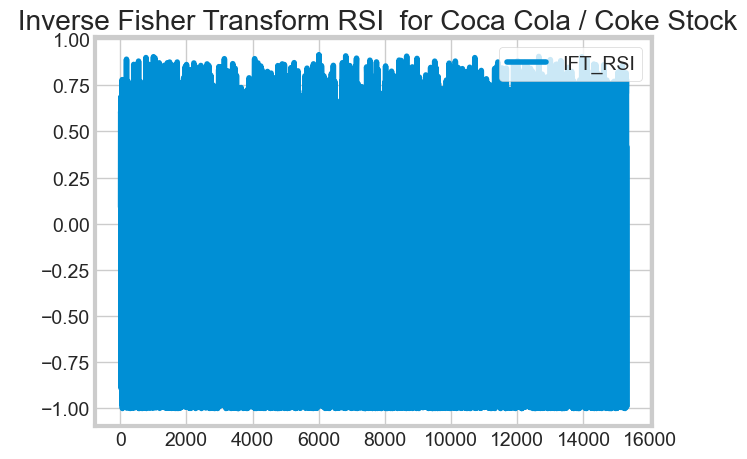


Calculating: TA.TR(ohlc)
Type of result for  True Range : <class 'pandas.core.series.Series'>
Result for  True Range :
0        0.001362
1        0.001857
2        0.000743
3        0.001857
4        0.001424
           ...   
15306    1.000000
15307    1.119999
15308    1.770000
15309    1.540001
15310    0.919998
Name: TR, Length: 15311, dtype: float64



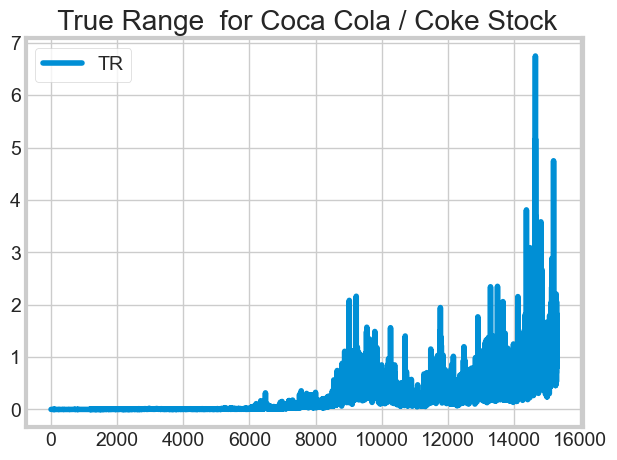


Calculating: TA.ATR(ohlc)
Type of result for  Average True Range : <class 'pandas.core.series.Series'>
Result for  Average True Range :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306    1.187858
15307    1.208572
15308    1.238572
15309    1.257858
15310    1.225715
Name: 14 period ATR, Length: 15311, dtype: float64

Plotting error (Series) for  Average True Range : no numeric data to plot

Calculating: TA.SAR(ohlc)
Type of result for  Stop-and-Reverse : <class 'pandas.core.series.Series'>
Result for  Stop-and-Reverse :
0        -0.233385
1        -0.227689
2        -0.222108
3        -0.216638
4        -0.211278
           ...    
15306    54.746938
15307    54.909583
15308    54.990002
15309    55.264001
15310    55.725521
Length: 15311, dtype: float64



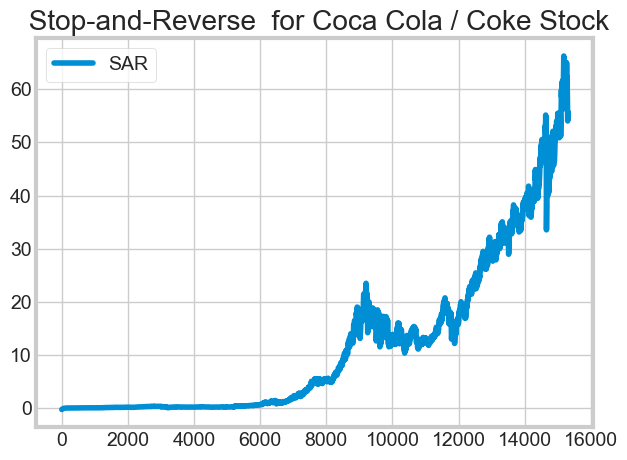


Calculating: TA.BBANDS(ohlc)
Type of result for  Bollinger Bands : <class 'pandas.core.frame.DataFrame'>
Result for  Bollinger Bands :
        BB_UPPER  BB_MIDDLE   BB_LOWER
0            NaN        NaN        NaN
1            NaN        NaN        NaN
2            NaN        NaN        NaN
3            NaN        NaN        NaN
4            NaN        NaN        NaN
...          ...        ...        ...
15306  58.219906    55.9830  53.746093
15307  57.718798    55.8510  53.983201
15308  57.639230    55.8360  54.032769
15309  58.236346    55.9645  53.692653
15310  58.796710    56.0850  53.373290

[15311 rows x 3 columns]



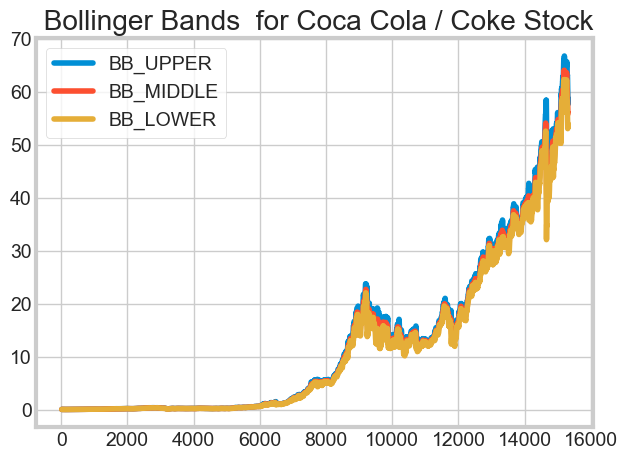


Calculating: TA.BBWIDTH(ohlc)
Type of result for  Bollinger Bands Width : <class 'pandas.core.series.Series'>
Result for  Bollinger Bands Width :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306    0.079914
15307    0.066885
15308    0.064590
15309    0.081189
15310    0.096700
Name: 20 period BBWITH, Length: 15311, dtype: float64

Plotting error (Series) for  Bollinger Bands Width : no numeric data to plot

Calculating: TA.MOBO(ohlc)
Type of result for  Momentum Breakout Bands : <class 'pandas.core.frame.DataFrame'>
Result for  Momentum Breakout Bands :
        BB_UPPER  BB_MIDDLE   BB_LOWER
0            NaN        NaN        NaN
1            NaN        NaN        NaN
2            NaN        NaN        NaN
3            NaN        NaN        NaN
4            NaN        NaN        NaN
...          ...        ...        ...
15306  55.819184  55.253999  54.688815
15307  55.947237  55.398999  54.850762
15308  56.418014  55.7

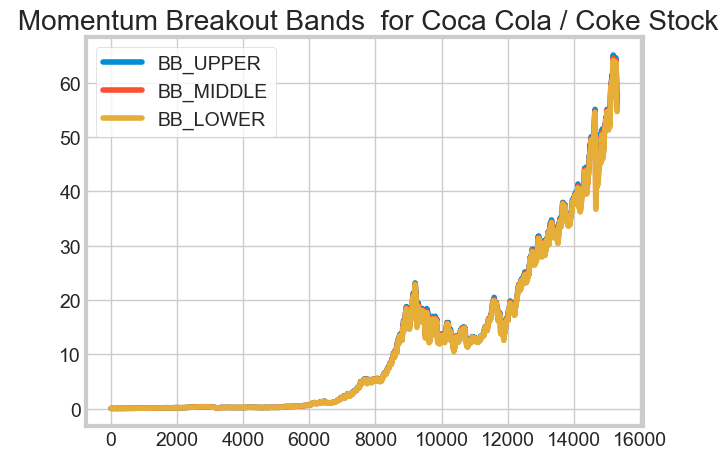


Calculating: TA.PERCENT_B(ohlc)
Type of result for  Percent B : <class 'pandas.core.series.Series'>
Result for  Percent B :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306    0.298159
15307    0.529179
15308    0.980804
15309    1.157065
15310    1.109394
Name: %b, Length: 15311, dtype: float64

Plotting error (Series) for  Percent B : no numeric data to plot

Calculating: TA.KC(ohlc)
Type of result for  Keltner Channels : <class 'pandas.core.frame.DataFrame'>
Result for  Keltner Channels :
        KC_UPPER   KC_LOWER
0            NaN        NaN
1            NaN        NaN
2            NaN        NaN
3            NaN        NaN
4            NaN        NaN
...          ...        ...
15306  58.741976  54.017972
15307  58.757978  53.921975
15308  59.041123  53.873120
15309  59.390541  53.998536
15310  59.519251  54.383248

[15311 rows x 2 columns]



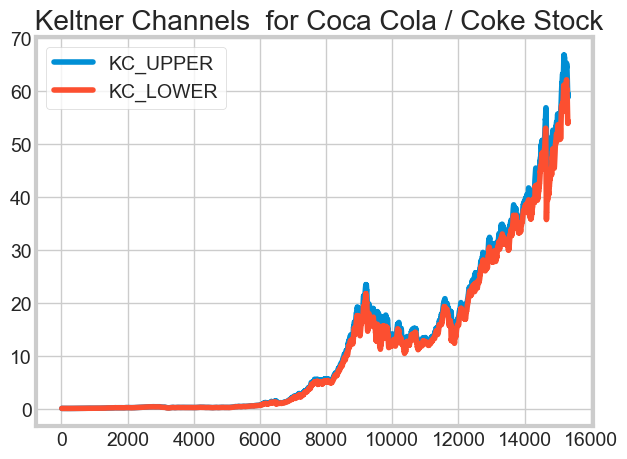


Calculating: TA.DO(ohlc)
Type of result for  Donchian Channel : <class 'pandas.core.frame.DataFrame'>
Result for  Donchian Channel :
           LOWER     MIDDLE      UPPER
0            NaN        NaN        NaN
1            NaN        NaN        NaN
2            NaN        NaN        NaN
3            NaN        NaN        NaN
4       0.046735        NaN        NaN
...          ...        ...        ...
15306  54.939999  57.019999  59.099998
15307  54.959999  56.764999  58.570000
15308  54.959999  56.664999  58.369999
15309  54.959999  57.035000  59.110001
15310  54.959999  57.369999  59.779999

[15311 rows x 3 columns]



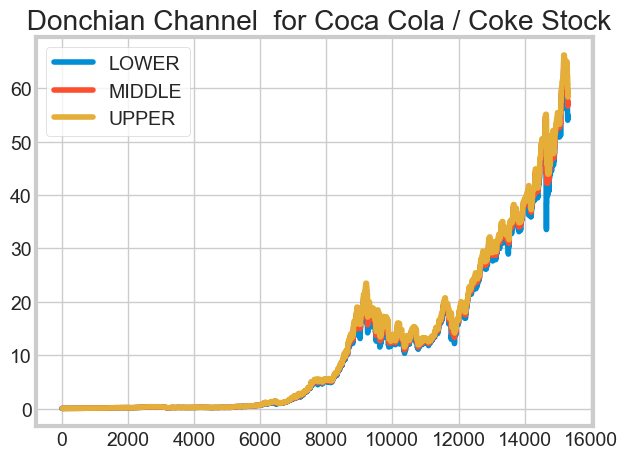


Calculating: TA.DMI(ohlc)
Type of result for  Directional Movement Indicator : <class 'pandas.core.frame.DataFrame'>
Result for  Directional Movement Indicator :
             DI+        DI-
0            NaN        NaN
1            NaN        NaN
2            NaN        NaN
3            NaN        NaN
4            NaN        NaN
...          ...        ...
15306  14.877362  28.723631
15307  14.937638  26.671943
15308  23.213212  24.766804
15309  29.391583  22.997747
15310  31.196600  21.355050

[15311 rows x 2 columns]



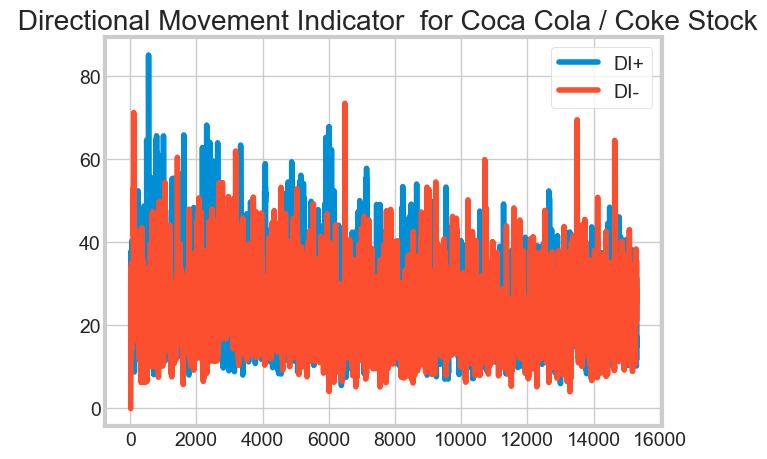


Calculating: TA.ADX(ohlc)
Type of result for  Average Directional Index : <class 'pandas.core.series.Series'>
Result for  Average Directional Index :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    32.314847
15307    32.020998
15308    29.965070
15309    28.696455
15310    27.984378
Name: 14 period ADX., Length: 15311, dtype: float64

Plotting error (Series) for  Average Directional Index : no numeric data to plot

Calculating: TA.PIVOT(ohlc)
Type of result for  Pivot Points : <class 'pandas.core.frame.DataFrame'>
Result for  Pivot Points :
           pivot         s1         s2         s3         s4         r1  \
0            NaN        NaN        NaN        NaN        NaN        NaN   
1       0.050470   0.049562   0.049108   0.048200   0.047292   0.050924   
2       0.048778   0.048283   0.047664   0.047168   0.046673   0.049397   
3       0.049314   0.048984   0.048695   0.048365   0.048035   0.049603   
4 

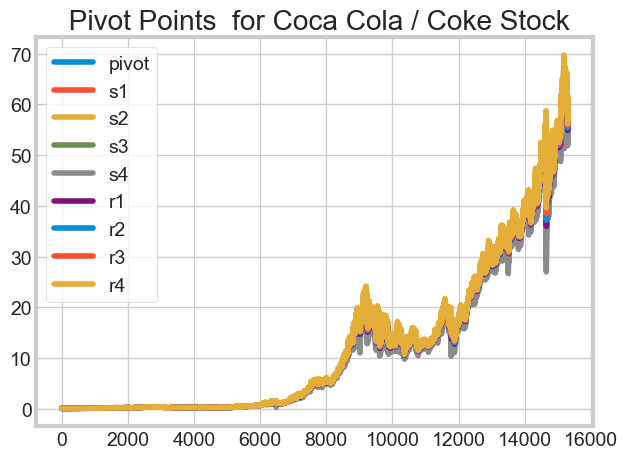


Calculating: TA.PIVOT_FIB(ohlc)
Type of result for  Fibonacci Pivot Points : <class 'pandas.core.frame.DataFrame'>
Result for  Fibonacci Pivot Points :
           pivot         s1         s2         s3         s4         r1  \
0            NaN        NaN        NaN        NaN        NaN        NaN   
1       0.050470   0.049950   0.049628   0.049108   0.048588   0.050990   
2       0.048778   0.048352   0.048089   0.047664   0.047238   0.049204   
3       0.049314   0.049078   0.048932   0.048695   0.048459   0.049551   
4       0.048695   0.047986   0.047548   0.046838   0.046129   0.049405   
...          ...        ...        ...        ...        ...        ...   
15306  56.076667  55.767246  55.576086  55.266665  54.957245  56.386087   
15307  55.320000  54.953280  54.726720  54.360001  53.993281  55.686719   
15308  55.686667  55.258828  54.994508  54.566668  54.138829  56.114507   
15309  57.290000  56.846880  56.573120  56.130000  55.686880  57.733120   
15310  58.603334  58.0

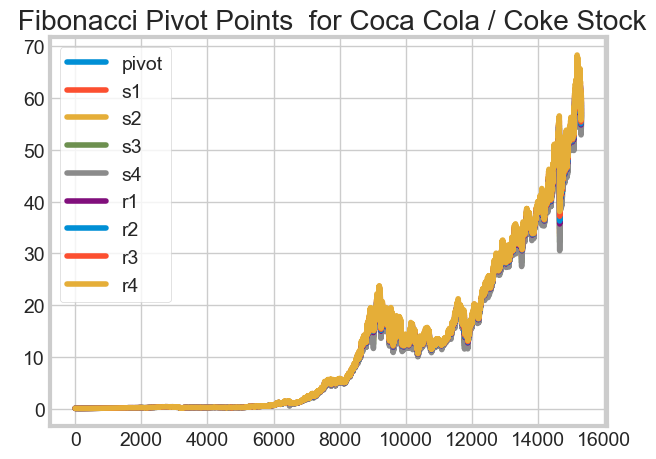


Calculating: TA.STOCH(ohlc)
Type of result for  Stochastic Oscillator Percent K : <class 'pandas.core.series.Series'>
Result for  Stochastic Oscillator Percent K :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    27.968367
15307    51.187286
15308    95.687335
15309    96.856585
15310    93.229175
Name: 14 period STOCH %K, Length: 15311, dtype: float64

Plotting error (Series) for  Stochastic Oscillator Percent K : no numeric data to plot

Calculating: TA.STOCHD(ohlc)
Type of result for  Stochastic oscillator Percent D : <class 'pandas.core.series.Series'>
Result for  Stochastic oscillator Percent D :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    47.669278
15307    43.447647
15308    58.280996
15309    81.243735
15310    95.257698
Name: 3 period STOCH %D., Length: 15311, dtype: float64

Plotting error (Series) for  Stochastic oscillator

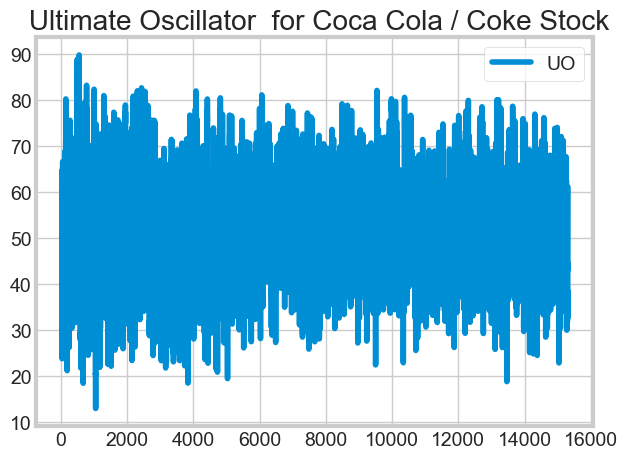


Calculating: TA.AO(ohlc)
Type of result for  Awesome Oscillator : <class 'pandas.core.series.Series'>
Result for  Awesome Oscillator :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306   -2.069639
15307   -1.928949
15308   -1.563685
15309   -1.076657
15310   -0.379288
Name: AO, Length: 15311, dtype: float64



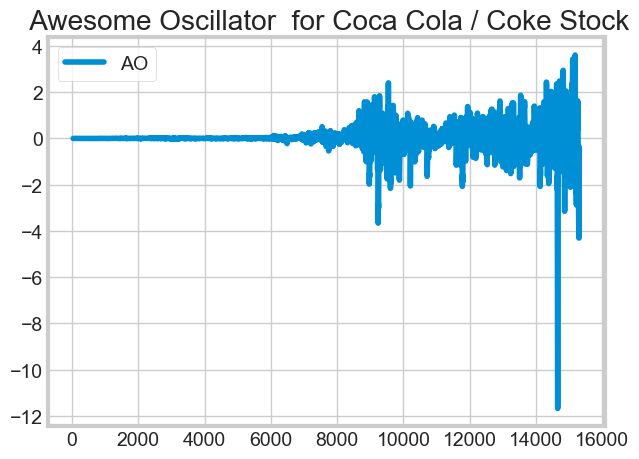


Calculating: TA.MI(ohlc)
Type of result for  Mass Index : <class 'pandas.core.series.Series'>
Result for  Mass Index :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    25.237872
15307    25.230125
15308    25.260796
15309    25.371723
15310    25.364522
Name: Mass Index, Length: 15311, dtype: float64

Plotting error (Series) for  Mass Index : no numeric data to plot

Calculating: TA.KST(ohlc)
Type of result for  Know Sure Thing : <class 'pandas.core.frame.DataFrame'>
Result for  Know Sure Thing :
             KST     signal
0            NaN        NaN
1            NaN        NaN
2            NaN        NaN
3            NaN        NaN
4            NaN        NaN
...          ...        ...
15306 -82.927127 -90.332927
15307 -77.030414 -89.394664
15308 -68.712803 -87.169930
15309 -58.409797 -83.688790
15310 -48.165357 -79.044112

[15311 rows x 2 columns]



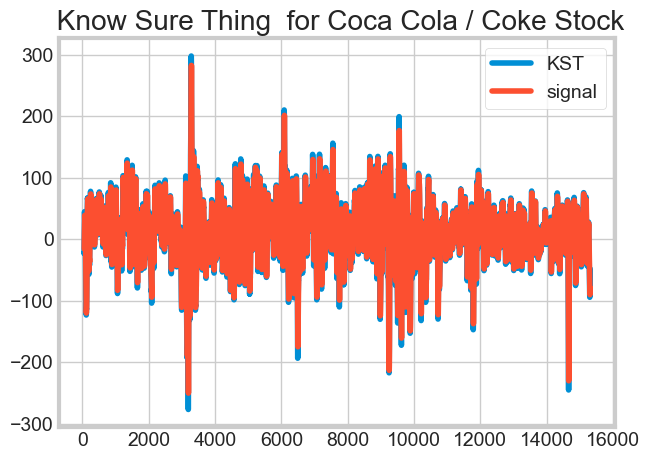


Calculating: TA.TSI(ohlc)
Type of result for  True Strength Index : <class 'pandas.core.frame.DataFrame'>
Result for  True Strength Index :
             TSI     signal
0            NaN        NaN
1            NaN        NaN
2            NaN        NaN
3            NaN        NaN
4            NaN        NaN
...          ...        ...
15306 -29.391819 -36.248588
15307 -26.442186 -34.847674
15308 -20.426146 -32.787455
15309 -13.012324 -29.962437
15310  -6.648687 -26.631901

[15311 rows x 2 columns]



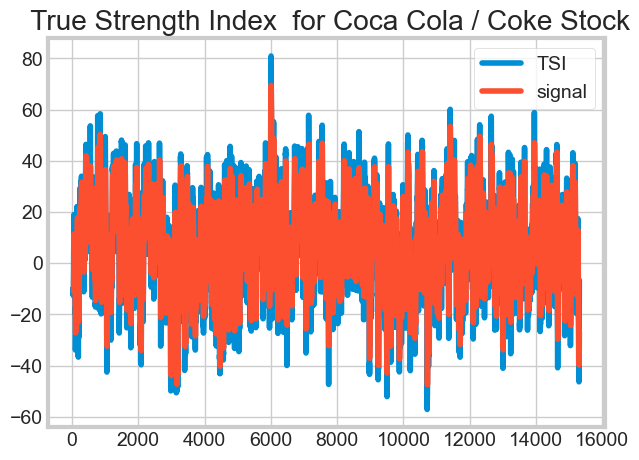


Calculating: TA.TP(ohlc)
Type of result for  Typical Price : <class 'pandas.core.series.Series'>
Result for  Typical Price :
0         0.050470
1         0.048778
2         0.049314
3         0.048695
4         0.047395
           ...    
15306    55.320000
15307    55.686667
15308    57.290000
15309    58.603334
15310    59.343333
Name: TP, Length: 15311, dtype: float64



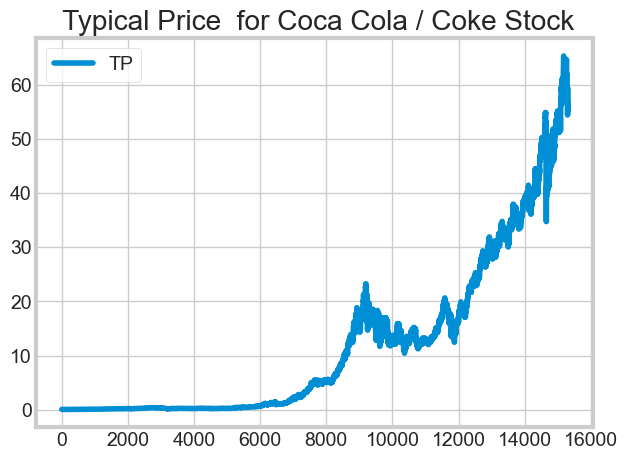


Calculating: TA.ADL(ohlc)
Type of result for  Accumulation-Distribution Line : <class 'pandas.core.series.Series'>
Result for  Accumulation-Distribution Line :
0       -8.064000e+05
1       -2.819673e+05
2       -4.509219e+05
3       -1.682301e+06
4       -1.259279e+05
             ...     
15306    6.518708e+09
15307    6.529711e+09
15308    6.542323e+09
15309    6.564369e+09
15310    6.566779e+09
Name: MFV, Length: 15311, dtype: float64

Plotting error (Series) for  Accumulation-Distribution Line : no numeric data to plot

Calculating: TA.CHAIKIN(ohlc)
Type of result for  Chaikin Oscillator : <class 'pandas.core.series.Series'>
Result for  Chaikin Oscillator :
0                 NaN
1                 NaN
2                 NaN
3                 NaN
4                 NaN
             ...     
15306   -1.932958e+07
15307   -1.499256e+07
15308   -7.842426e+06
15309    2.810342e+06
15310    7.679345e+06
Name: MFV, Length: 15311, dtype: float64

Plotting error (Series) for  Chaikin Oscilla

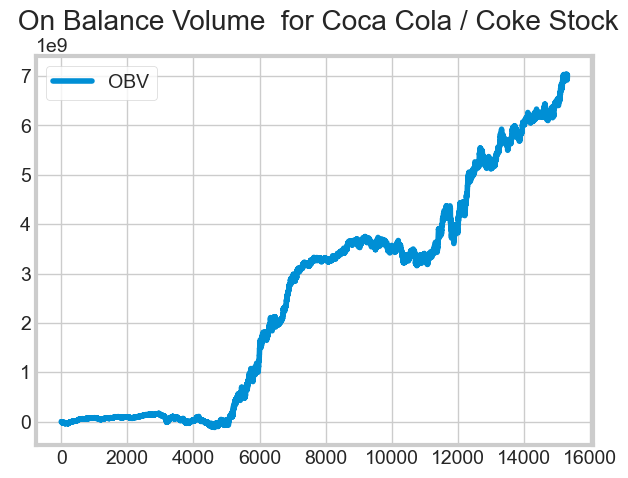


Calculating: TA.WOBV(ohlc)
Type of result for  Weighter OBV : <class 'pandas.core.series.Series'>
Result for  Weighter OBV :
0                 NaN
1       -1.754420e+03
2       -1.440517e+03
3       -3.023780e+03
4       -4.031525e+03
             ...     
15306   -1.913821e+08
15307   -1.781575e+08
15308   -1.501166e+08
15309   -1.103313e+08
15310   -1.033655e+08
Name: WOBV, Length: 15311, dtype: float64



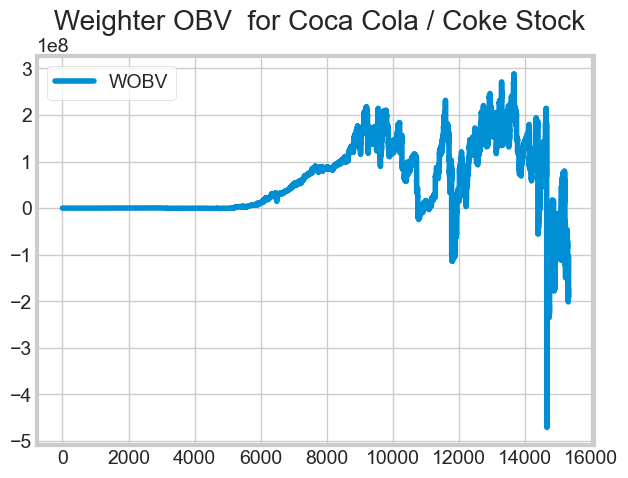


Calculating: TA.VZO(ohlc)
Type of result for  Volume Zone Oscillator : <class 'pandas.core.series.Series'>
Result for  Volume Zone Oscillator :
0         0.000000
1       -69.256757
2       -18.461259
3       -48.470809
4       -67.960453
           ...    
15306    -9.691982
15307     5.340628
15308    20.001333
15309    38.263697
15310    46.065030
Name: VZO, Length: 15311, dtype: float64



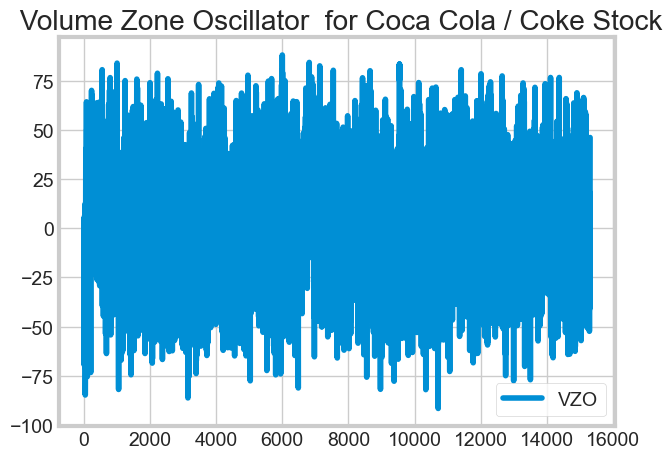


Calculating: TA.PZO(ohlc)
Type of result for  Price Zone Oscillator : <class 'pandas.core.series.Series'>
Result for  Price Zone Oscillator :
0         0.000000
1       -53.010583
2         5.333287
3       -26.341306
4       -45.170095
           ...    
15306   -11.798145
15307     3.124630
15308    16.374725
15309    28.008539
15310    38.030246
Name: 14 period PZO, Length: 15311, dtype: float64

Plotting error (Series) for  Price Zone Oscillator : no numeric data to plot

Calculating: TA.EFI(ohlc)
Type of result for  Elders Force Index : <class 'pandas.core.series.Series'>
Result for  Elders Force Index :
0                 NaN
1       -1.754420e+03
2       -6.407075e+02
3       -1.004371e+03
4       -1.005418e+03
             ...     
15306   -2.102031e+06
15307    8.748741e+04
15308    4.080832e+06
15309    9.181469e+06
15310    8.864944e+06
Name: 13 period Force Index, Length: 15311, dtype: float64

Plotting error (Series) for  Elders Force Index : no numeric data to plot

Calcu

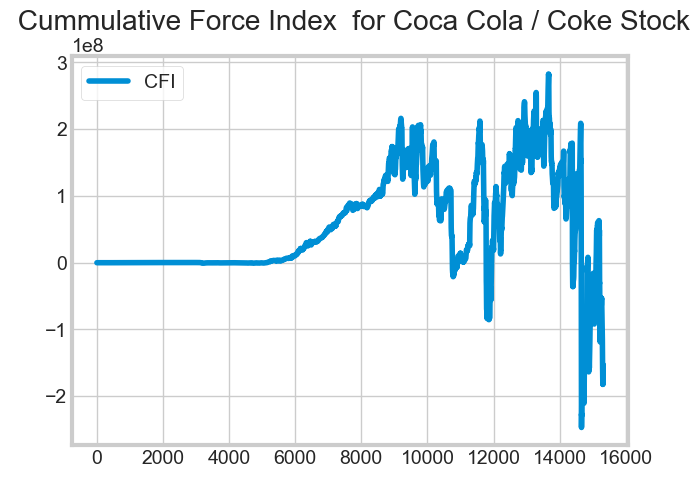


Calculating: TA.EBBP(ohlc)
Type of result for  Bull power and Bear Power : <class 'pandas.core.frame.DataFrame'>
Result for  Bull power and Bear Power :
          Bull.     Bear.
0      0.001362  0.000000
1     -0.000143 -0.001257
2      0.000284 -0.000335
3      0.000904 -0.000953
4     -0.000848 -0.001901
...         ...       ...
15306  0.100629 -0.859370
15307  0.270542 -0.849457
15308  1.643321  0.483321
15309  2.614276  1.254275
15310  2.870806  1.950808

[15311 rows x 2 columns]



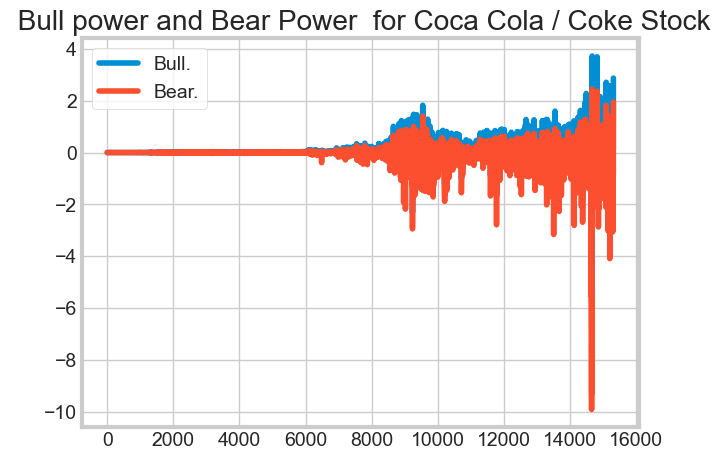


Calculating: TA.EMV(ohlc)
Type of result for  Ease of Movement : <class 'pandas.core.series.Series'>
Result for  Ease of Movement :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306   -0.008041
15307   -0.007074
15308   -0.002939
15309    0.007371
15310    0.014106
Name: 14 period EMV., Length: 15311, dtype: float64

Plotting error (Series) for  Ease of Movement : no numeric data to plot

Calculating: TA.CCI(ohlc)
Type of result for  Commodity Channel Index : <class 'pandas.core.series.Series'>
Result for  Commodity Channel Index :
0               NaN
1        -66.666667
2        -21.734114
3        -71.428922
4       -133.044160
            ...    
15306    -61.540492
15307    -24.283304
15308    130.107489
15309    222.170142
15310    233.253464
Name: 20 period CCI, Length: 15311, dtype: float64

Plotting error (Series) for  Commodity Channel Index : no numeric data to plot

Calculating: TA.COPP(ohlc)
Type of result for

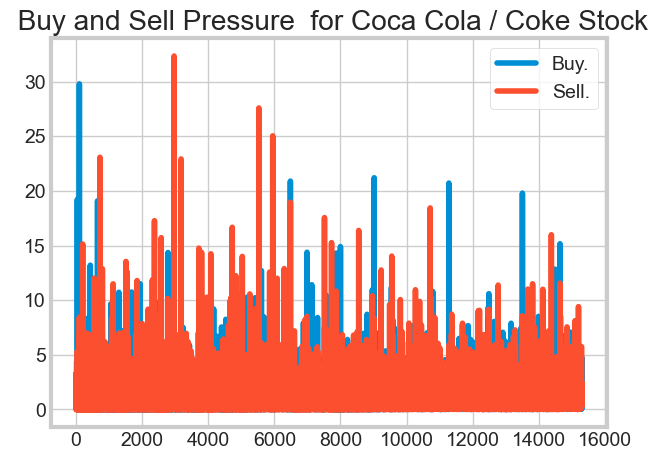


Calculating: TA.BASPN(ohlc)
Type of result for  Normalized BASP : <class 'pandas.core.frame.DataFrame'>
Result for  Normalized BASP :
           Buy.     Sell.
0           NaN  1.000000
1      2.560000  0.774599
2      1.521592  0.646480
3      1.162052  1.088904
4      1.779599  0.882884
...         ...       ...
15306  0.861785  1.227682
15307  1.011782  1.134601
15308  1.172296  1.056813
15309  1.510249  1.005747
15310  1.474713  0.977283

[15311 rows x 2 columns]



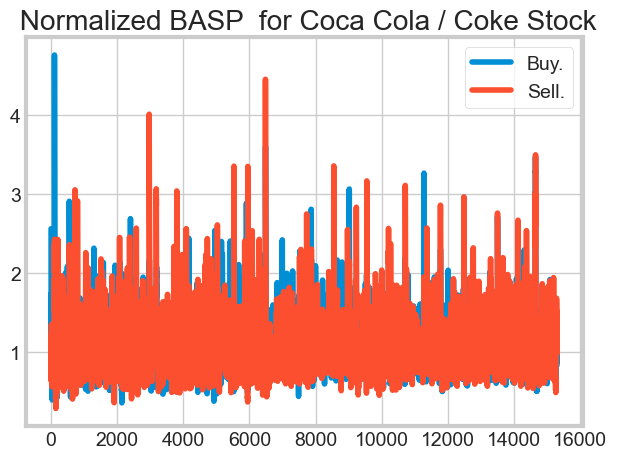


Calculating: TA.CMO(ohlc)
Type of result for  Chande Momentum Oscillator : <class 'pandas.core.series.Series'>
Result for  Chande Momentum Oscillator :
0               NaN
1       -100.000000
2        -45.932815
3        -71.555909
4        -76.949312
            ...    
15306    -21.747069
15307     -5.163084
15308     17.642277
15309     31.740049
15310     35.642815
Name: CMO, Length: 15311, dtype: float64



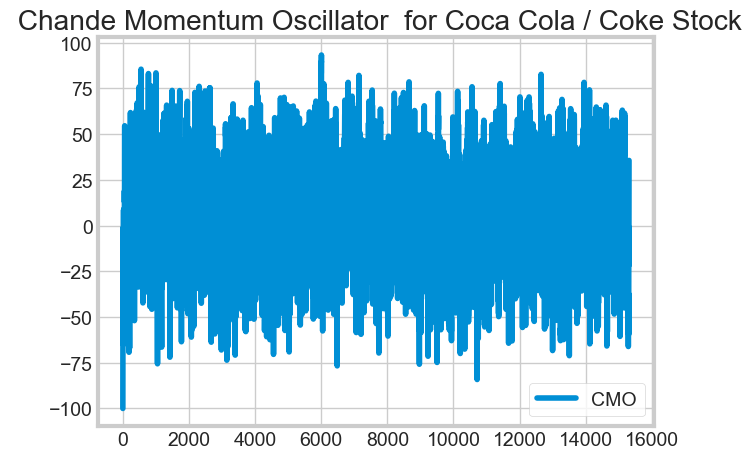


Calculating: TA.CHANDELIER(ohlc)
Type of result for  Chandelier Exit : <class 'pandas.core.frame.DataFrame'>
Result for  Chandelier Exit :
          Short.      Long.
0            NaN        NaN
1            NaN        NaN
2            NaN        NaN
3            NaN        NaN
4            NaN        NaN
...          ...        ...
15306  57.628184  57.091818
15307  57.602274  56.147726
15308  57.771365  55.348634
15309  57.809548  55.320453
15310  57.810911  55.989088

[15311 rows x 2 columns]



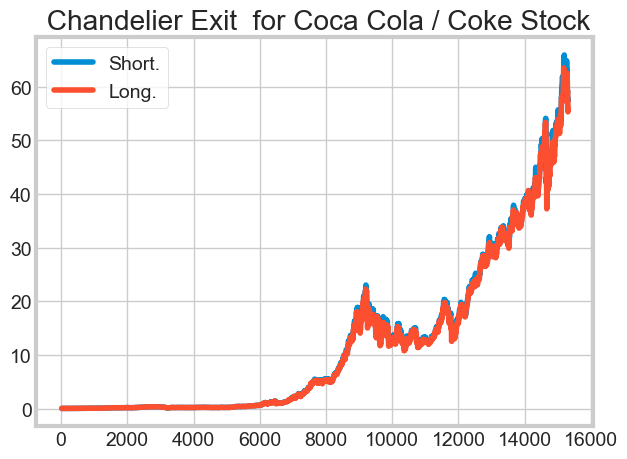


Calculating: TA.QSTICK(ohlc)
Type of result for  Qstick : <class 'pandas.core.series.Series'>
Result for  Qstick :
15297   -0.034286
15298   -0.015000
15299    0.001429
15300   -0.006429
15301    0.099286
15302   -0.093572
15303    0.004286
15304    0.009286
15305   -0.025000
15306   -0.049286
15307    0.068571
15308    0.066429
15309   -0.006429
15310    0.027143
Name: 14 period QSTICK., dtype: float64

Plotting error (Series) for  Qstick : no numeric data to plot

Calculating: TA.WTO(ohlc)
Type of result for  Wave Trend Oscillator : <class 'pandas.core.frame.DataFrame'>
Result for  Wave Trend Oscillator :
             WT1.       WT2.
0             NaN        NaN
1     -121.212121        NaN
2      -73.140392        NaN
3      -79.628233        NaN
4      -95.621642 -92.400597
...           ...        ...
15306  -36.086983 -40.157861
15307  -33.689343 -36.155636
15308  -18.838691 -30.817620
15309   -3.118329 -22.933337
15310    9.245888 -11.600119

[15311 rows x 2 columns]



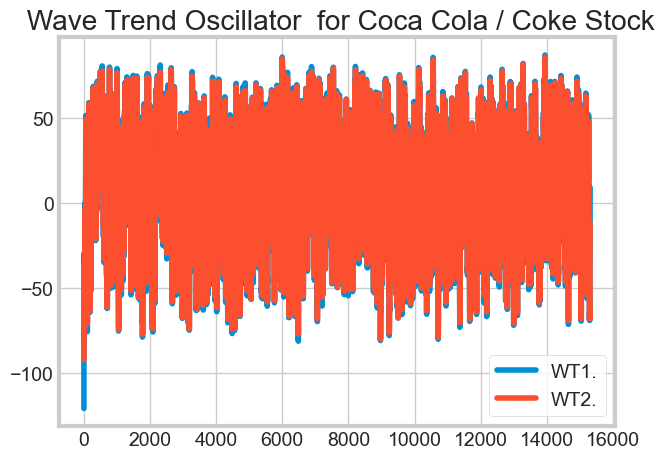


Calculating: TA.FISH(ohlc)
Type of result for  Fisher Transform : <class 'pandas.core.series.Series'>
Result for  Fisher Transform :
0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
           ...   
15306    0.297425
15307    0.320667
15308    0.641095
15309    1.064015
15310    1.514532
Name: 10 period FISH., Length: 15311, dtype: float64

Plotting error (Series) for  Fisher Transform : no numeric data to plot

Calculating: TA.ICHIMOKU(ohlc)
Type of result for  Ichimoku Cloud : <class 'pandas.core.frame.DataFrame'>
Result for  Ichimoku Cloud :
          TENKAN      KIJUN  senkou_span_a     SENKOU    CHIKOU
0            NaN        NaN            NaN        NaN  0.046673
1            NaN        NaN            NaN        NaN  0.046797
2            NaN        NaN            NaN        NaN  0.047045
3            NaN        NaN            NaN        NaN  0.046673
4            NaN        NaN            NaN        NaN  0.046673
...          ...      

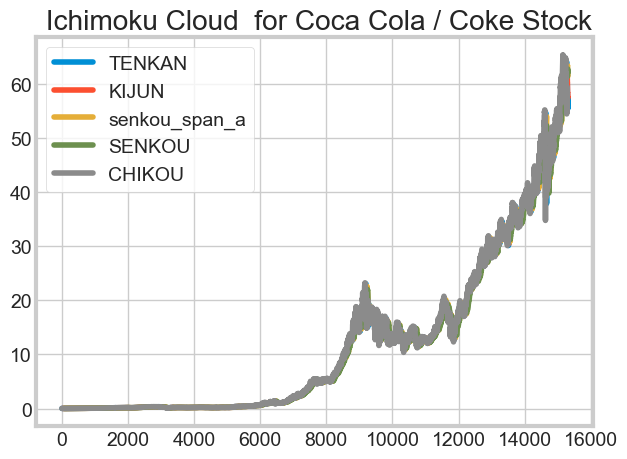


Calculating: TA.APZ(ohlc)
Type of result for  Adaptive Price Zone : <class 'pandas.core.frame.DataFrame'>
Result for  Adaptive Price Zone :
           UPPER      LOWER
0       0.052739   0.047292
1       0.051742   0.046567
2       0.051540   0.046782
3       0.051039   0.046211
4       0.050559   0.045733
...          ...        ...
15306  56.841486  52.610773
15307  56.910418  52.682395
15308  57.258127  53.028922
15309  57.810051  53.569863
15310  58.367178  54.122542

[15311 rows x 2 columns]



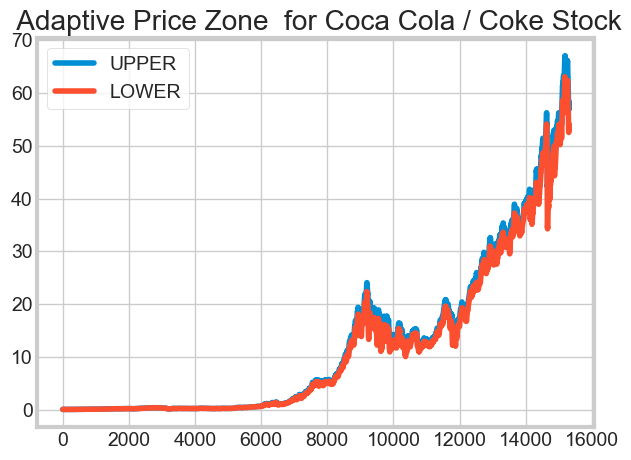


Calculating: TA.VPT(ohlc)
Type of result for  Volume Price Trend : <class 'pandas.core.series.Series'>
Result for  Volume Price Trend :
0        0.000000e+00
1       -1.049967e+06
2       -3.741219e+05
3       -2.079202e+06
4       -2.558029e+06
             ...     
15306    8.575267e+09
15307    8.601029e+09
15308    8.628956e+09
15309    8.625140e+09
15310    8.638219e+09
Name: VPT, Length: 15311, dtype: float64



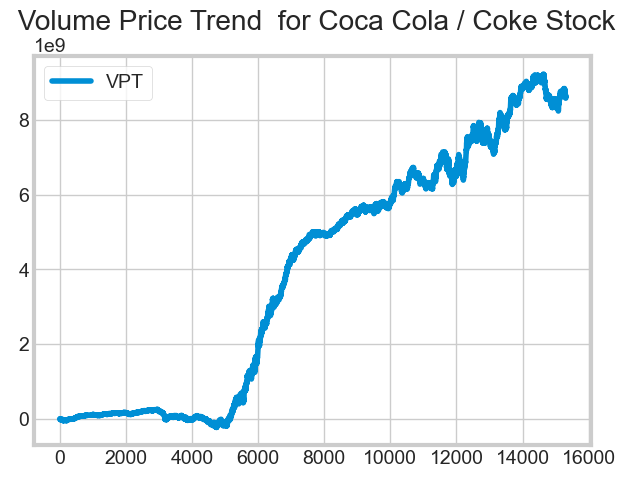


Calculating: TA.FVE(ohlc)
Type of result for  Finite Volume Element : <class 'pandas.core.series.Series'>
Result for  Finite Volume Element :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306   -38.944268
15307   -30.312096
15308   -21.451776
15309    -8.557480
15310     0.985012
Length: 15311, dtype: float64



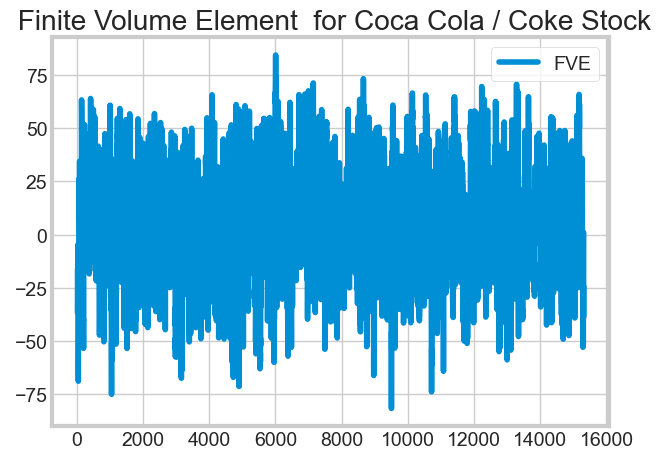


Calculating: TA.VFI(ohlc)
Type of result for  Volume Flow Indicator : <class 'pandas.core.series.Series'>
Result for  Volume Flow Indicator :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306   -12.343351
15307   -12.245066
15308   -12.010763
15309   -11.426975
15310   -11.075005
Name: VFI, Length: 15311, dtype: float64



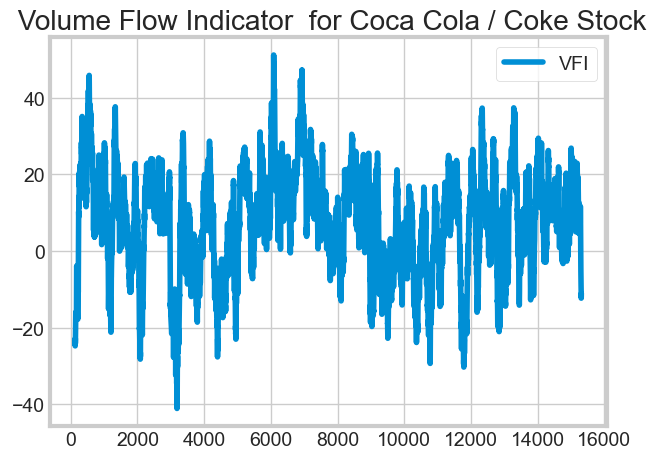


Calculating: TA.MSD(ohlc)
Type of result for  Moving Standard deviation : <class 'pandas.core.series.Series'>
Result for  Moving Standard deviation :
0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
15306    1.303748
15307    1.090145
15308    0.984516
15309    1.110867
15310    1.335878
Name: MSD, Length: 15311, dtype: float64



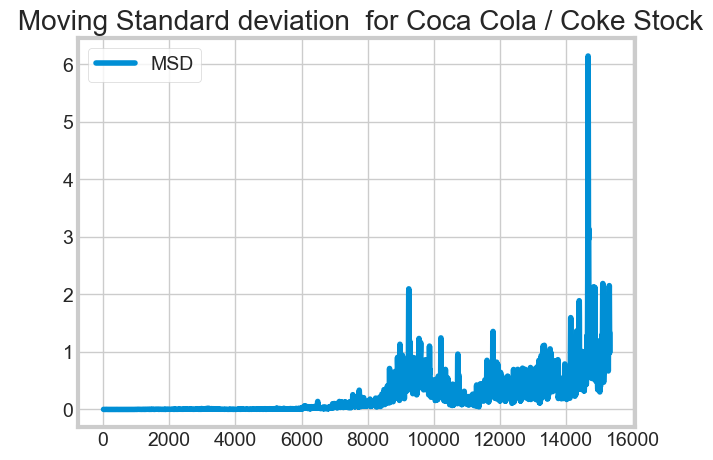


Calculating: TA.STC(ohlc)
Type of result for  Schaff Trend Cycle : <class 'pandas.core.series.Series'>
Result for  Schaff Trend Cycle :
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    19.883818
15307    37.995452
15308    59.649182
15309    81.644127
15310    94.485365
Name: 10 period STC, Length: 15311, dtype: float64

Plotting error (Series) for  Schaff Trend Cycle : no numeric data to plot



In [80]:
for key, value in function_dict.items():
    function_name = "TA." + value + "(ohlc)"
    print(f"Calculating: {function_name}")
    result = eval(function_name)
    print(f"Type of result for {key}: {type(result)}")
    print(f"Result for {key}:\n{result}") # Print the actual result
    print()
    if isinstance(result, pd.Series):
        df_to_plot = pd.DataFrame(result, columns=[value])
        try:
            df_to_plot.plot(title=f"{key} for Coca Cola / Coke Stock")
            plt.show()
        except TypeError as e:
            print(f"Plotting error (Series) for {key}: {e}")
    elif hasattr(result, 'plot'):
        try:
            result.plot(title=f"{key} for Coca Cola / Coke Stock")
            plt.show()
        except TypeError as e:
            print(f"Plotting error (DataFrame) for {key}: {e}")
    else:
        print(f"Could not plot result for {key}")
    print()

TA.SMA(ohlc).plot(title=' Simple Moving Average for Coca Cola / Coke Stock')

TA.SMM(ohlc).plot(title=' Simple Moving Median for Coca Cola / Coke Stock')

TA.SSMA(ohlc).plot(title=' Smoothed Simple Moving Average for Coca Cola / Coke Stock')

TA.EMA(ohlc).plot(title=' Exponential Moving Average for Coca Cola / Coke Stock')

TA.DEMA(ohlc).plot(title=' Double Exponential Moving Average for Coca Cola / Coke Stock')

TA.TEMA(ohlc).plot(title=' Triple Exponential Moving Average for Coca Cola / Coke Stock')

TA.TRIMA(ohlc).plot(title=' Triangular Moving Average for Coca Cola / Coke Stock')

TA.TRIX(ohlc).plot(title=' Triple Exponential Moving Average Oscillator for Coca Cola / Coke Stock')

TA.VAMA(ohlc).plot(title=' Volume Adjusted Moving Average for Coca Cola / Coke Stock')

TA.ER(ohlc).plot(title=' Kaufman Efficiency Indicator for Coca Cola / Coke Stock')

TA.ZLEMA(ohlc).plot(title=' Zero Lag Exponential Moving Average for Coca Cola / Coke Stock')

TA.WMA(ohlc).plot(title=' Weighted Movin

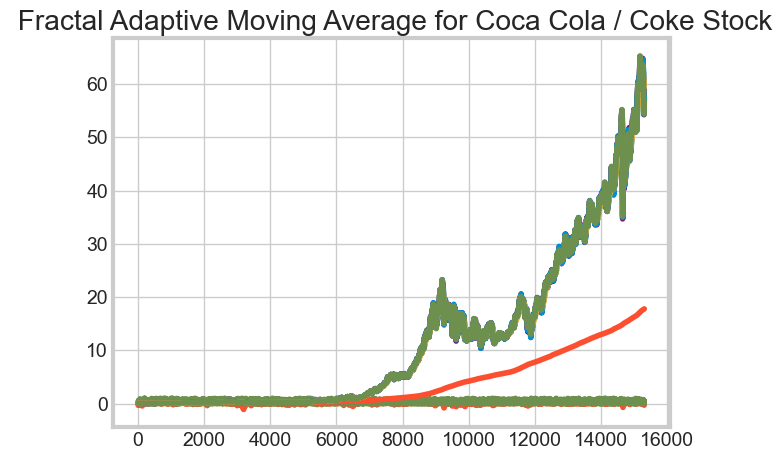

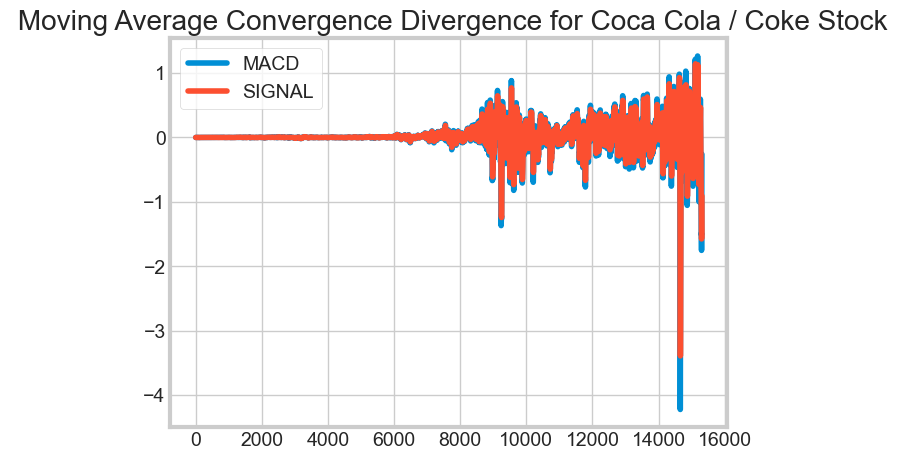

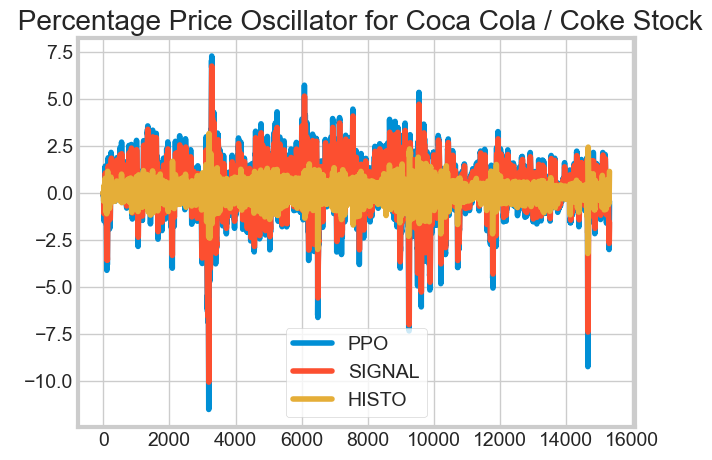

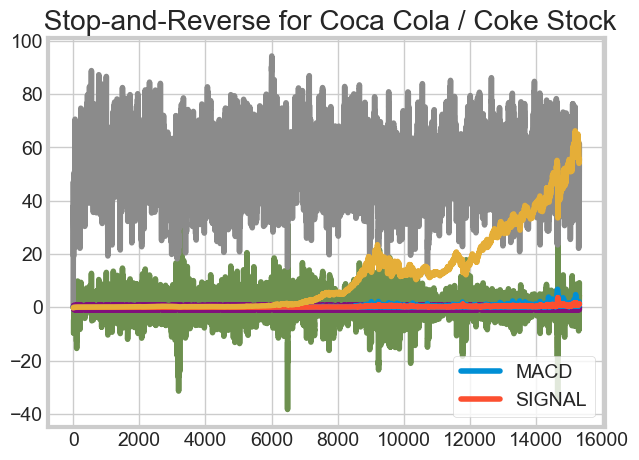

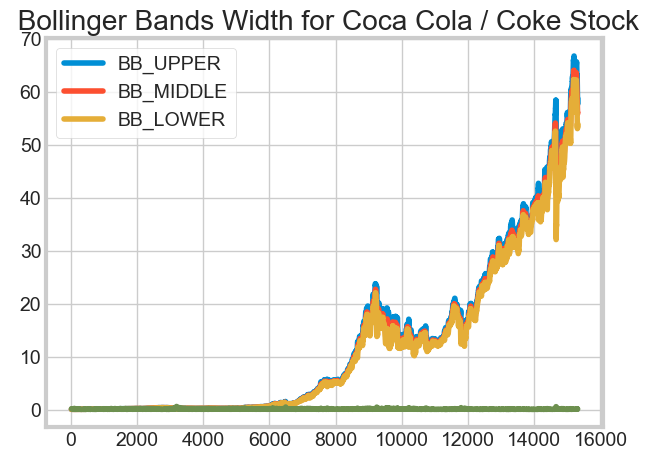

...

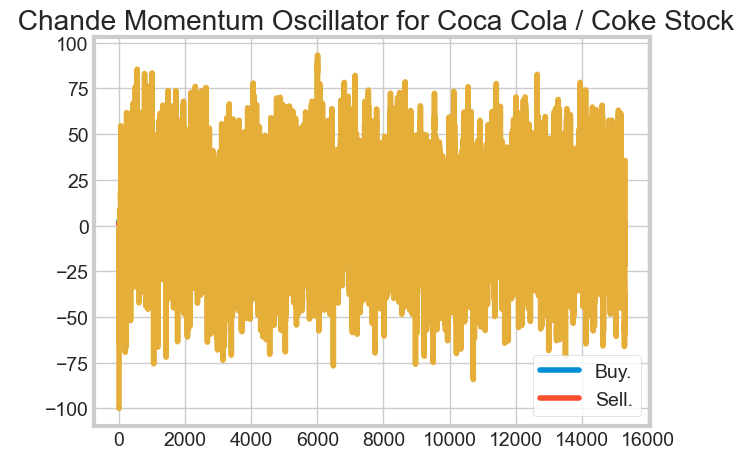

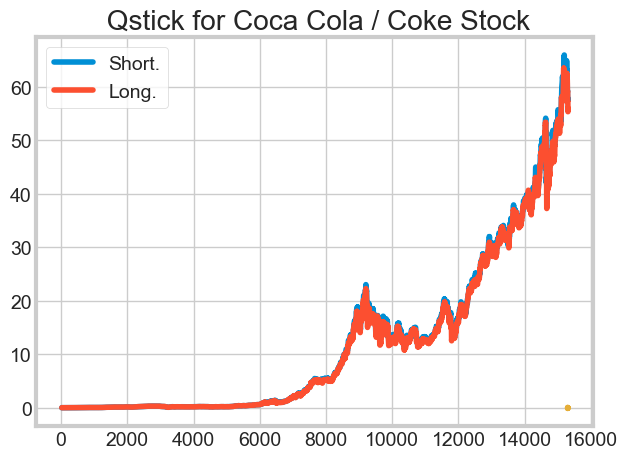

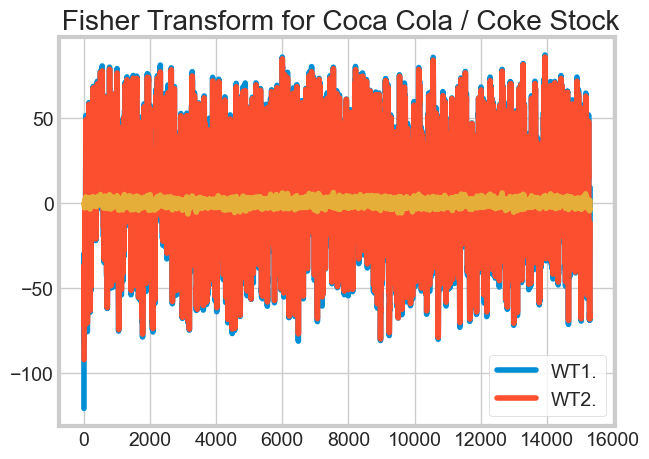

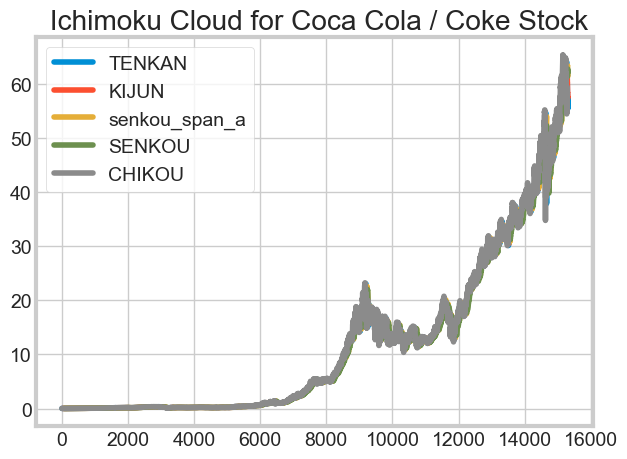

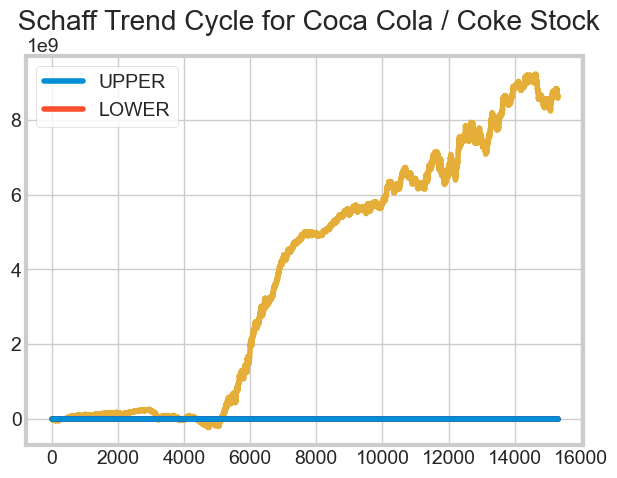

In [79]:
for key, value in function_dict .items():
    function_name = "TA." + value + "(ohlc).plot(title='" + key + "for Coca Cola / Coke Stock')"
    print(function_name)
    result = eval(function_name)
    print()

## Defining DEMA cross strategy

In [81]:
class DemaCross(Strategy):
    
    def init(self):
        self.ma1 = self.I(TA.DEMA, ohlc, 10)
        self.ma2 = self.I(TA.DEMA, ohlc, 20)

    def next(self):
        if crossover(self.ma1, self.ma2):
            self.buy()
        elif crossover(self.ma2, self.ma1):
            self.sell()

In [82]:
ohlc.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [83]:
ohlc.Date

0                       1962-01-02
1                       1962-01-03
2                       1962-01-04
3                       1962-01-05
4                       1962-01-08
                   ...            
15306    2022-10-20 00:00:00-04:00
15307    2022-10-21 00:00:00-04:00
15308    2022-10-24 00:00:00-04:00
15309    2022-10-25 00:00:00-04:00
15310    2022-10-26 00:00:00-04:00
Name: Date, Length: 15311, dtype: object

In [84]:
bt = Backtest(ohlc, DemaCross, cash=100000, commission=0.015, exclusive_orders=True)

In [85]:
bt

In [86]:
# Back Testing Summary

bt.run()

Backtest.run:   0%|          | 0/15310 [00:00<?, ?bar/s]

Start                                     0.0
End                                   15310.0
Duration                              15310.0
Exposure Time [%]                    26.88263
Equity Final [$]                      0.19041
Equity Peak [$]                      100000.0
Commissions [$]                   77449.51548
Return [%]                          -99.99981
Buy & Hold Return [%]            118642.19364
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Alpha [%]                           -88.72432
Beta                                  -0.0001
Max. Drawdown [%]                   -99.99981
Avg. Drawdown [%]                   -99.99981
Max. Drawdown Duration                15304.0
Avg. Drawdown Duration                15304.0
# Trades                                362.0
Win Rate [%]                      

As we can see, if we had invested $100,000 in Coca Cola shares, we would have got by now a return of 118642%

In [87]:
bt.plot()

GridPlot(id='p1325', ...)

In [ ]:
# BackTesting Trading Strategy Heatmaps

In [88]:
data = ohlc

In [89]:
data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [92]:
def BBANDS(data, n_lookback, n_std):
    """Bollinger bands indicator"""
    hlc3 = (data.High + data.Low + data.Close) / 3
    mean, std = hlc3.rolling(n_lookback).mean(), hlc3.rolling(n_lookback).std()
    upper = mean + n_std*std
    lower = mean - n_std*std
    return upper, lower

In [93]:
close = data.Close.values
sma10 = SMA(data.Close, 10)
sma20 = SMA(data.Close, 20)
sma50 = SMA(data.Close, 50)
sma100 = SMA(data.Close, 100)
upper, lower = BBANDS(data, 20, 2)

In [ ]:
# Design matrix / independent features:

In [95]:
# Price-derived features

data['X_SMA10'] = (close - sma10) / close
data['X_SMA20'] = (close - sma20) / close
data['X_SMA50'] = (close - sma50) / close
data['X_SMA100'] = (close - sma100) / close
data['X_DELTA_SMA10'] = (sma10 - sma20) / close
data['X_DELTA_SMA20'] = (sma20 - sma50) / close
data['X_DELTA_SMA50'] = (sma50 - sma100) / close

In [96]:
# Indicator features

data['X_MOM'] = data.Close.pct_change(periods=2)
data['X_BB_upper'] = (upper - close) / close
data['X_BB_lower'] = (lower - close) / close
data['X_BB_width'] = (upper - lower) / close

In [98]:
data.head().T

,0,1,2,3,4
Date,1962-01-02,1962-01-03,1962-01-04,1962-01-05,1962-01-08
Open,0.050016,0.049273,0.049026,0.049273,0.047787
High,0.051378,0.049273,0.049645,0.049892,0.047787
Low,0.050016,0.048159,0.049026,0.048035,0.046735
Close,0.050016,0.048902,0.049273,0.048159,0.047664
Volume,806400,1574400,844800,1420800,2035200
Dividends,0.0,0.0,0.0,0.0,0.0
Stock Splits,0,0,0,0,0
X_SMA10,NaN,NaN,NaN,NaN,NaN
X_SMA20,NaN,NaN,NaN,NaN,NaN


In [ ]:
# data['X_Sentiment'] = ~data.index.to_series().between('2017-09-27', '2017-12-14')

In [ ]:
# Some datetime features for good measure
                       
# data['X_day'] = data.index.dayofweek
# data['X_hour'] = data.index.hour
# data = data.apply(pd.to_numeric)
# data = data.dropna().astype(np.float64)
# data.fillna(method="ffill")
# data =data[~data.isin([np.nan, np.inf, -np.inf]).any(1)]
# data.replace([np.inf, -np.inf], 0.0, inplace=True)
# data = data.fillna(data.mean(), inplace=True)
# data = data.dropna().astype(np.float64)

In [100]:
class Sma4Cross(Strategy):
    n1 = 50
    n2 = 100
    n_enter = 20
    n_exit = 10
    
    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
        self.sma_enter = self.I(SMA, self.data.Close,
        self.n_enter)
        self.sma_exit = self.I(SMA, self.data.Close,
        self.n_exit)

    def next(self):
        if not self.position:
            if self.sma1 > self.sma2:
                if crossover(self.data.Close, self.sma_enter):
                    self.buy()
                else:
                    if crossover(self.sma_enter, self.data.Close):
                        self.sell()
                    else:
                        if (self.position.is_long and crossover(self.sma_exit, self.data.Close) or self.position.is_short and crossover(self.data.Close, self.sma_exit)):
                            self.position.close()

In [102]:
%time

CPU times: total: 0 ns
Wall time: 0 ns


In [104]:
backtest = Backtest(ohlc, Sma4Cross, commission=.002)
backtest

In [ ]:
# stats, heatmap = backtest.optimize( n1=range(10, 110, 10),
#                                     n2=range(20, 210, 20),
#                                     n_enter=range(15, 35, 5),
#                                     n_exit=range(10, 25, 5),
#                                     constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
#                                     maximize='Equity Final [$]',
#                                     max_tries=200,
#                                     random_state=0,
#                                     return_heatmap=True
#                                   )

# TypeError: buffer is too small for requested array

In [113]:
# %%capture

In [115]:
%time

CPU times: total: 0 ns
Wall time: 0 ns


In [118]:
stats_skopt, heatmap, optimize_result = backtest.optimize( n1=[10, 100],
                                                           n2=[20, 200],
                                                           n_enter=[10, 40],
                                                           n_exit=[10, 30],
                                                           constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
                                                           maximize='Equity Final [$]', method='skopt',
                                                           max_tries=200,
                                                           random_state=0,
                                                           return_heatmap=True,
                                                           return_optimization=True
                                                         )

Backtest.optimize:   0%|          | 0/200 [00:00<?, ?it/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15240 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15226 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15248 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15202 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15140 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15177 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15242 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15224 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15214 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15240 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15238 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15185 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15241 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15244 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15189 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15177 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15219 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15227 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15214 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15181 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15118 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15175 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15180 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15219 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15115 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15224 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15193 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15200 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15178 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15199 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15192 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15213 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15116 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15213 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15220 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15184 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15210 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15136 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15186 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15206 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15281 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15200 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15212 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15220 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15193 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15196 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15199 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15168 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15185 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15175 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15206 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15258 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15119 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15227 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15218 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15221 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15185 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15185 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15180 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15206 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15204 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15165 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15222 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15209 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15214 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15195 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15193 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15248 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15188 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15202 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15208 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15217 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15207 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15164 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15181 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15205 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15144 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15218 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15224 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15159 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15218 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15122 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15192 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15197 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15112 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15207 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15264 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15213 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15213 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15177 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15222 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15183 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15207 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15246 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15215 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15226 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15192 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15206 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15197 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15208 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15183 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15205 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15169 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15170 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15224 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15196 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15154 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15216 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15170 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15220 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15189 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15205 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15206 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15186 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15199 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15204 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15200 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15192 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15196 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15158 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15197 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15236 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15204 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15223 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15193 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15219 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15192 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15217 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15219 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15183 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15176 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15181 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15212 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15153 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15208 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15152 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15181 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15205 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15114 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15189 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15219 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15207 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15219 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15204 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15195 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15197 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15186 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15203 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15243 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15175 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15205 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15228 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15215 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15225 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15228 [00:00<?, ?bar/s]

In [ ]:
hm = heatmap.groupby(['n1', 'n2']).mean().unstack()

In [124]:
hm.head()

n2,30,47,53,60,63,65,67,68,70,71,...,167,175,189,191,192,193,195,196,197,199
n1,,,,,,,,,,,,,,,,,,,,,
19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.235508e+07,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,1.286987e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,NaN,NaN,NaN,1.235508e+07,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
plot_heatmaps(heatmap, agg='mean')

GridPlot(id='p1637', ...)